# <span style= "color:#FFDB00;">**Harry Potter Book Collection**</span>  

*Sentiment and Word Cloud Analysis*

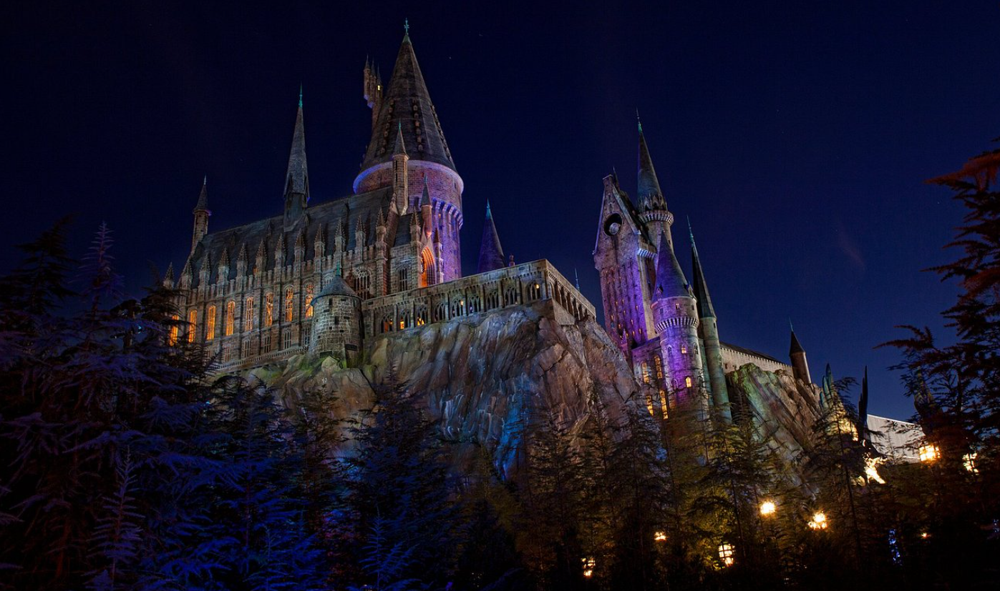

The Harry Potter book series, written by British author J.K. Rowling, is one of the most influential literary phenomena of all time. Spanning seven books, the series was published between 1997 (Harry Potter and the Philosopher’s Stone) and 2007 (Harry Potter and the Deathly Hallows), chronicling the journey of a young wizard, Harry Potter, as he battles the dark lord Voldemort. The books have been translated into over 80 languages, making them accessible to readers worldwide. As of 2024, the series has sold more than 600 million copies globally, ranking as the best-selling book series in history. The cultural impact has been profound, inspiring a billion-dollar film franchise, merchandise, theme parks, and a renewed interest in reading among younger generations.

The series has also earned numerous accolades, including the British Book Awards and the Hugo Award (won by Harry Potter and the Goblet of Fire in 2001). Rowling’s work reshaped children’s literature, blending fantasy with themes of friendship, courage, and identity. It has also sparked academic interest, with college courses and literary analyses dedicated to the books. Overall, Harry Potter remains a landmark achievement in modern literature with enduring popularity and cultural resonance.

## <span style="color: #FFDB00;">**Alohomora**</span>

### <span style= "color:black;">**Imports, Read, and Data Assignments**</span>

In [ ]:
##############################
#last file update- 2025/05/11
##############################

import pandas as pd 
import numpy as np  
import nltk
import matplotlib.pyplot as plt 
%matplotlib inline


from tabulate import tabulate
from collections import Counter  
from nltk.corpus import stopwords 
from nltk.util import ngrams 
from wordcloud import WordCloud,STOPWORDS,ImageColorGenerator 
from PIL import Image

nltk.download('opinion_lexicon')
from nltk.corpus import opinion_lexicon

[nltk_data] Downloading package opinion_lexicon to
[nltk_data]     C:\Users\bebop\AppData\Roaming\nltk_data...
[nltk_data]   Package opinion_lexicon is already up-to-date!


In [2]:
#read the txt files and append together for a complete works variable
filenames = [
    "text data/01 Harry Potter and the Sorcerers Stone.txt",
    "text data/02 Harry Potter and the Chamber of Secrets.txt",
    "text data/03 Harry Potter and the Prisoner of Azkaban.txt",
    "text data/04 Harry Potter and the Goblet of Fire.txt",
    "text data/05 Harry Potter and the Order of the Phoenix.txt",
    "text data/06 Harry Potter and the Half-Blood Prince.txt",
    "text data/07 Harry Potter and the Deathly Hallows.txt"
]

bookC = []
for filename in filenames:
    with open(filename, "r", encoding="utf-8") as f:
        bookC.append(f.read())
        
#Combine all book contents into one string and save with other books .txt files
potter_Complete = "\n\n".join(bookC)
output_path = "text data/08 Harry Potter and the Complete Works.txt"
with open(output_path, "w", encoding="utf-8") as f:
    f.write(potter_Complete)

In [3]:
#Reading .txt data into a variable
def read_book(title_path):
    with open(title_path, "r", encoding ="utf8") as current_file:
        text = current_file.read()
        text = text.replace("\n", "").replace("\r", "")
    return text

In [4]:
#assignments for each book
book1 = read_book('text data/01 Harry Potter and the Sorcerers Stone.txt')
book2 = read_book('text data/02 Harry Potter and the Chamber of Secrets.txt')
book3 = read_book('text data/03 Harry Potter and the Prisoner of Azkaban.txt')
book4 = read_book('text data/04 Harry Potter and the Goblet of Fire.txt')
book5 = read_book('text data/05 Harry Potter and the Order of the Phoenix.txt')
book6 = read_book('text data/06 Harry Potter and the Half-Blood Prince.txt')
book7 = read_book('text data/07 Harry Potter and the Deathly Hallows.txt')
book8 = read_book('text data/08 Harry Potter and the Complete Works.txt')


In [5]:
#reference for the book names
book_names = [
    "Sorcerer's Stone", "Chamber of Secrets", "Prisoner of Azkaban",
    "Goblet of Fire", "Order of the Phoenix", "Half-Blood Prince", "Deathly Hallows", "Complete Works"
]

## <span style= "color:darkblue;">**Expelliarmus**</span>

###  <span style= "color:#CD7F32;">**Prep and Analyze the .txt Data**</span> 

In [6]:
#Changing the case to lower and removing punctuations
def case_punct(book):
    book = book.lower()
    book =  ' '.join([word for word in book.split() if word.isalnum()])
    return book

book1 = case_punct(book1)
book2 = case_punct(book2)
book3 = case_punct(book3)
book4 = case_punct(book4)
book5 = case_punct(book5)
book6 = case_punct(book6)
book7 = case_punct(book7)
book8 = case_punct(book8)

In [7]:
#Default English stopwords
stopwords = nltk.corpus.stopwords.words('english')

#Defining context specific stopwords
#Adding characters to list. "Harry" value dominates all books
STOPWORDS = ["harry","potter","hermione","ron","j","k","rowling","s","t","said","page","professor","know","back","i","j.k","like","could",'would',
            "philosophers","stone","chamber","secrets","prisoner","azbakan","goblet","fire","order","phoenix","half","blood","prince","deathly","hallows",
            "looked","one","got","get","see","going","go","told","look","looking","tell","saw","think","around",
            "though","even","still","weasley","pg"]
stopwords = stopwords +list(STOPWORDS)

#length of words removed
print("Total number of stopwords:", len(stopwords))

# Create a DataFrame to display clean stopword list
potter_sw = pd.DataFrame(stopwords, columns=['Stopword'])
print(potter_sw)


Total number of stopwords: 251
    Stopword
0          a
1      about
2      above
3      after
4      again
..       ...
246   though
247     even
248    still
249  weasley
250       pg

[251 rows x 1 columns]


In [8]:
#remove the stopwords from the assigned book variables
def remove_stopwords(book_sw):
    book_sw = ' '.join([word for word in book_sw.split() if word not in stopwords])
    return book_sw

book1_rs = remove_stopwords(book1)
book2_rs = remove_stopwords(book2)
book3_rs = remove_stopwords(book3)
book4_rs = remove_stopwords(book4)
book5_rs = remove_stopwords(book5)
book6_rs = remove_stopwords(book6)
book7_rs = remove_stopwords(book7)
book8_rs = remove_stopwords(book8)

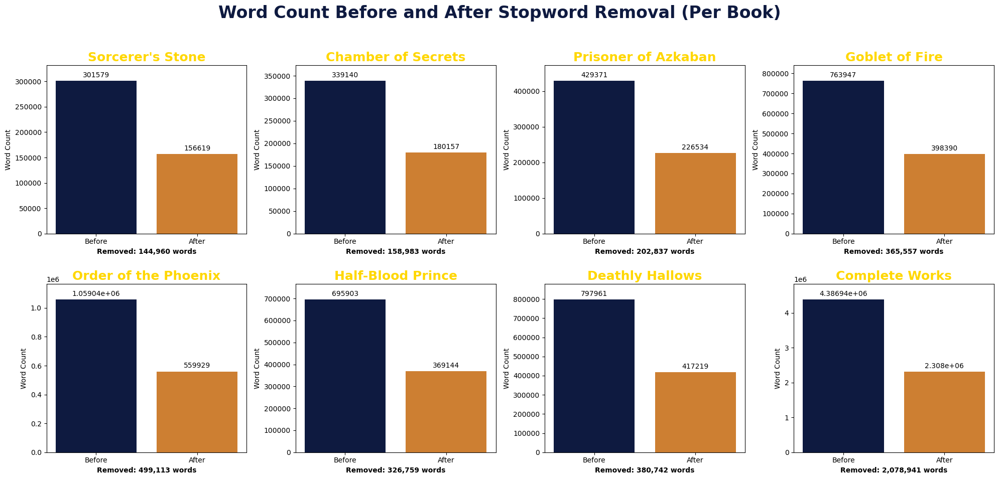

In [9]:
#viz plot the before and after stopword removal for all the listed books and complete works
before_counts = [len(book1), len(book2), len(book3), len(book4), len(book5), len(book6), len(book7), len(book8)]
after_counts = [len(book1_rs), len(book2_rs), len(book3_rs), len(book4_rs), len(book5_rs), len(book6_rs), len(book7_rs), len(book8_rs)]

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

removed_counts = [before - after for before, after in zip(before_counts, after_counts)]

#loop through the .txt books and display their before and after stopword removal values
for i in range(8):
    bars = axes[i].bar(['Before', 'After'], [before_counts[i], after_counts[i]], color=['#0E1A40', '#CD7F32'])   #color scheme for Ravenclaw based off books 
    axes[i].set_title(book_names[i], color="gold", fontsize=18, fontweight="bold")
    axes[i].set_ylabel('Word Count')
    axes[i].set_xlabel(f"Removed: {removed_counts[i]:,} words", fontweight="bold")
    axes[i].bar_label(bars, padding=3)    
    max_count = max(before_counts[i], after_counts[i])
    axes[i].set_ylim(0, max_count * 1.10)

fig.suptitle('Word Count Before and After Stopword Removal (Per Book)', fontsize=24, color= "#0E1A40", fontweight="bold")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


## <span style= "color:darkred;">**Legilimens**</span>

### <span style= "color:#FFC500">**Frequency Rates and Sentiment Analysis**</span>

In [10]:
#grab top 20 words from each book
book_titles = [
    "Sorcerer's Stone", "Chamber of Secrets", "Prisoner of Azkaban",
    "Goblet of Fire", "Order of the Phoenix", "Half-Blood Prince",
    "Deathly Hallows", "Complete Works"
]

#use the removed stopwords book variables
book_texts = [book1_rs, book2_rs, book3_rs, book4_rs, book5_rs, book6_rs, book7_rs, book8_rs]

def term_freq(book_tf):
    return Counter(book_tf.split()).most_common(20)

top_words_per_book = [term_freq(text) for text in book_texts]

data = {}
for title, top_words in zip(book_titles, top_words_per_book):    
    data[title] = [f"{word} ({count})" for word, count in top_words]

potter20 = pd.DataFrame(data, index=range(1, 21))
potter20

,Sorcerer's Stone,Chamber of Secrets,Prisoner of Azkaban,Goblet of Fire,Order of the Phoenix,Half-Blood Prince,Deathly Hallows,Complete Works
1,hagrid (163),eyes (112),black (195),dumbledore (261),sirius (329),dumbledore (438),wand (340),dumbledore (1541)
2,never (113),lockhart (110),lupin (185),eyes (238),dumbledore (323),thought (219),dumbledore (296),eyes (1179)
3,uncle (101),never (105),towards (132),toward (195),behind (293),little (218),seemed (253),thought (1125)
4,snape (100),malfoy (102),eyes (132),seemed (182),umbridge (280),malfoy (210),death (249),seemed (1113)
5,something (92),behind (93),snape (118),hagrid (179),towards (270),seemed (201),little (243),behind (1091)
6,first (89),come (85),behind (117),turned (178),thought (266),snape (193),knew (240),never (1042)
7,next (89),something (85),heard (114),come (176),want (257),time (191),asked (230),time (1032)
8,dudley (88),time (82),face (110),never (174),eyes (253),slughorn (191),thought (223),wand (1023)
9,people (83),large (78),time (109),behind (174),turned (250),dark (186),voldemort (219),turned (1013)
10,time (83),long (78),next (108),dark (173),door (248),asked (186),never (218),come (992)


In [ ]:
#Bigrams and Trigrams
def get_top_ngrams(text, n=2, top=20):
    tokens = text.split()
    n_grams = ngrams(tokens, n)
    return Counter(n_grams).most_common(top)

book_texts = [book1_rs, book2_rs, book3_rs, book4_rs, book5_rs, book6_rs, book7_rs, book8_rs]

top_n = 20

# Bigrams
all_bigrams = [get_top_ngrams(text, n=2, top=top_n) for text in book_texts]
data_bi = {}
for name, bigrams in zip(book_names, all_bigrams):
    data_bi[name] = [f"{w1} {w2} ({count})" for (w1, w2), count in bigrams]
df_bigrams = pd.DataFrame(data_bi, index=range(1, top_n+1))
print("Bigrams")
display(df_bigrams) 

# Trigrams
all_trigrams = [get_top_ngrams(text, n=3, top=top_n) for text in book_texts]
data_tri = {}
for name, trigrams in zip(book_names, all_trigrams):
    data_tri[name] = [f"{w1} {w2} {w3} ({count})" for (w1, w2, w3), count in trigrams]
df_trigrams = pd.DataFrame(data_tri, index=range(1, top_n+1))
print("Trigrams")
display(df_trigrams)

Bigrams


,Sorcerer's Stone,Chamber of Secrets,Prisoner of Azkaban,Goblet of Fire,Order of the Phoenix,Half-Blood Prince,Deathly Hallows,Complete Works
1,uncle vernon (56),nearly headless (29),sirius black (26),madame maxime (44),fred george (67),prime minister (58),death eaters (100),death eaters (240)
2,aunt petunia (39),uncle vernon (22),uncle vernon (25),4 firechapter (36),death eaters (62),death eaters (45),death eater (39),uncle vernon (206)
3,1 stonechapter (16),headless nick (20),fred george (25),great hall (35),uncle vernon (44),dark lord (32),dark lord (32),fred george (179)
4,nimbus two (15),madam pomfrey (20),aunt marge (23),fred george (34),defence dark (43),invisibility cloak (26),invisibility cloak (31),aunt petunia (147)
5,never seen (13),fred george (19),madam pomfrey (23),magical eye (34),aunt petunia (37),defense dark (24),elder wand (29),invisibility cloak (114)
6,first time (11),sorting hat (14),common room (23),quidditch world (33),ministry magic (36),death eater (23),first time (25),dark arts (110)
7,privet drive (10),2 secretschapter (13),defence dark (22),uncle vernon (33),dark arts (34),copy advanced (22),pointed wand (25),death eater (109)
8,first years (10),never seen (12),dark arts (20),death eaters (33),death eater (30),dark arts (20),dumbledore left (18),great hall (107)
9,fred george (10),hospital wing (12),aunt petunia (18),ludo bagman (29),daily prophet (29),lord voldemort (19),make sure (17),common room (105)
10,great hall (9),fifty years (12),invisibility cloak (16),aunt petunia (28),make sure (24),common room (18),wondered whether (17),dark lord (104)


Trigrams


,Sorcerer's Stone,Chamber of Secrets,Prisoner of Azkaban,Goblet of Fire,Order of the Phoenix,Half-Blood Prince,Deathly Hallows,Complete Works
1,nimbus two thousand (7),nearly headless nick (16),defence dark arts (19),care magical creatures (13),defence dark arts (30),defense dark arts (14),pulled invisibility cloak (9),defence dark arts (49)
2,vault seven hundred (4),defense dark arts (8),committee disposal dangerous (7),defense dark arts (11),educational decree number (12),copy advanced potionmaking (14),life lies albus (7),defense dark arts (35)
3,portrait fat lady (4),nimbus two thousand (6),care magical creatures (6),department regulation control (7),care magical creatures (10),eyes fixed upon (8),eyes fixed upon (7),care magical creatures (30)
4,uncle vernon aunt (3),hogwarts school witchcraft (5),nimbus two thousand (4),department international magical (6),international confederation wizards (8),door closed behind (5),closed door behind (6),nearly headless nick (28)
5,thousand magical herbs (3),justin nearly headless (5),vernon aunt petunia (4),regulation control magical (6),vernon aunt petunia (7),swung shut behind (5),first time since (5),gryffindor common room (19)
6,seven hundred thirteen (3),slytherin common room (4),gryffindor common room (4),copy daily prophet (6),jet red light (7),dumbledore raised wand (4),tales beedle bard (5),hogwarts school witchcraft (18)
7,bettie every flavor (3),making noise pretending (3),head boy badge (3),magical eye fixed (5),jet green light (7),pulling invisibility cloak (4),flash green light (4),eyes fixed upon (18)
8,tore eyes away (3),allowed use magic (3),uncle vernon aunt (3),quidditch world cup (4),reasonable restriction underage (6),pulled copy advanced (4),couple death eaters (4),vernon aunt petunia (17)
9,nearly headless nick (3),shut ears oven (3),aunt marge started (3),department magical games (4),nearly headless nick (6),advanced potionmaking bag (4),death eaters found (4),nimbus two thousand (17)
10,great uncle algie (3),heard uncle vernon (3),crookshanks leapt lightly (3),ever since first (4),gryffindor common room (6),eyes fell upon (4),last enemy shall (4),closed door behind (16)


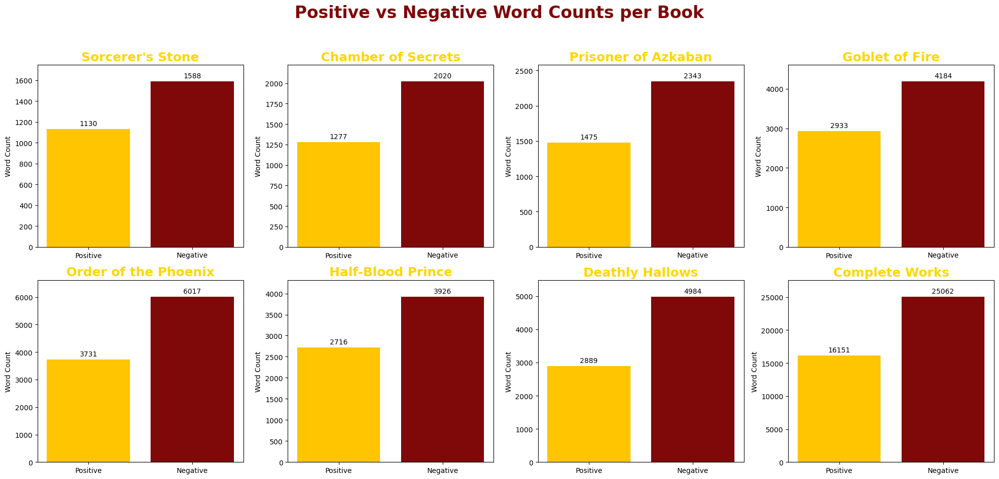

In [12]:
#Sentiment- possitive and negative words
positive_words = set(opinion_lexicon.positive())
negative_words = set(opinion_lexicon.negative())

def count_sentiment_words(text, pos_set, neg_set):
    words = text.split()
    pos_count = sum(1 for w in words if w in pos_set)
    neg_count = sum(1 for w in words if w in neg_set)
    return pos_count, neg_count

book_texts = [book1_rs, book2_rs, book3_rs, book4_rs, book5_rs, book6_rs, book7_rs, book8_rs]
pos_counts = []
neg_counts = []
for book in book_texts:
    pos, neg = count_sentiment_words(book, positive_words, negative_words)
    pos_counts.append(pos)
    neg_counts.append(neg)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))  # Adjust if you have a different number of books
axes = axes.flatten()

for i in range(len(book_names)):
    bars = axes[i].bar(['Positive', 'Negative'], [pos_counts[i], neg_counts[i]], color=['#FFC500', '#7F0909'])
    axes[i].set_title(book_names[i], color="gold", fontsize=18, fontweight="bold")
    axes[i].set_ylabel('Word Count')
    axes[i].bar_label(bars, padding=3)
    max_count = max(pos_counts[i], neg_counts[i])
    axes[i].set_ylim(0, max_count * 1.10)

# Hide any unused subplots if you don't have exactly 8 books
for j in range(len(book_names), len(axes)):
    axes[j].axis('off')

fig.suptitle('Positive vs Negative Word Counts per Book', fontsize=24, color="#7F0909", fontweight="bold")
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## <span style= "color:#2A623D;">**Revelio**</span>

### <span style= "color:#AAAAAA;">**Word Cloud Analysis**</span>

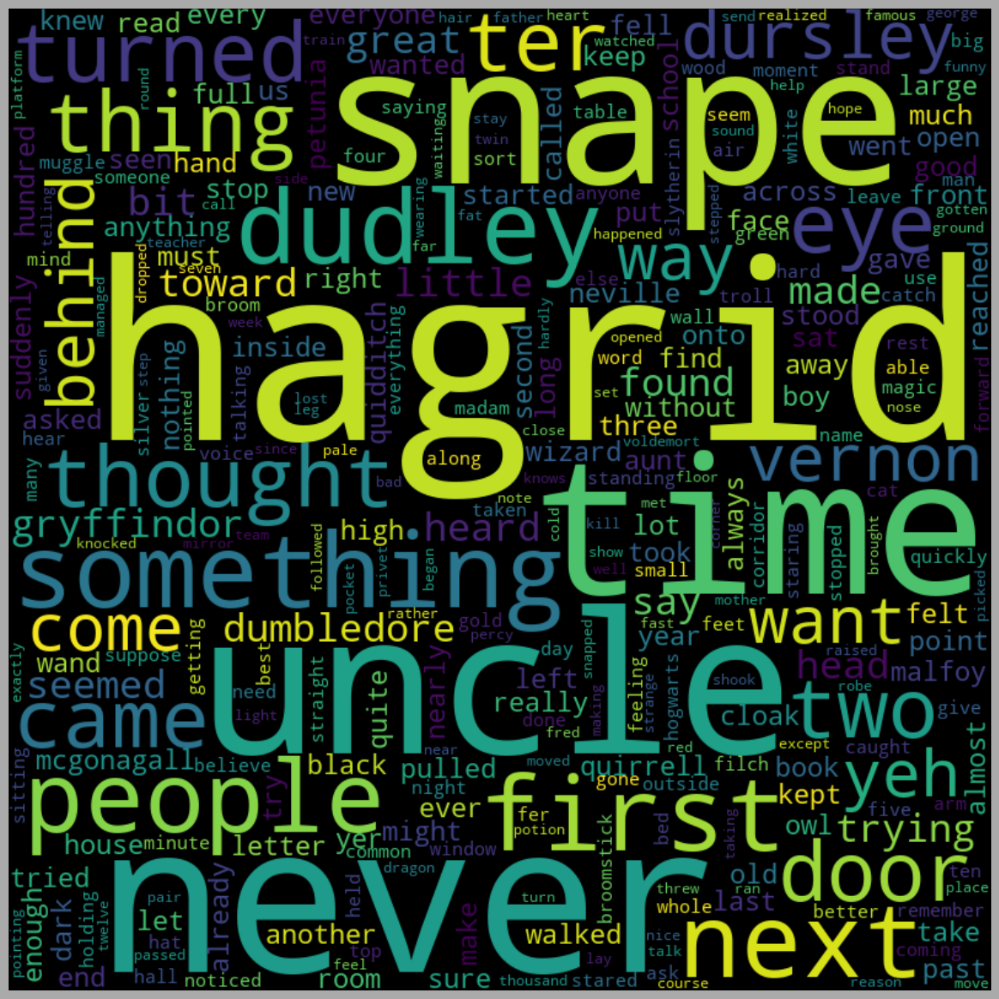

In [13]:
#Book1 Harry Potter and the Sorcerers Stone
wordcloud = WordCloud(width = 800, height = 800, 
                      background_color = 'black',
                      stopwords = stopwords, 
                      min_font_size = 10,
                      max_words=1000,
                      collocations=False).generate(book1_rs)
                     
plt.figure(figsize = (12, 12), facecolor = '#AAAAAA')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 2) 
plt.show()

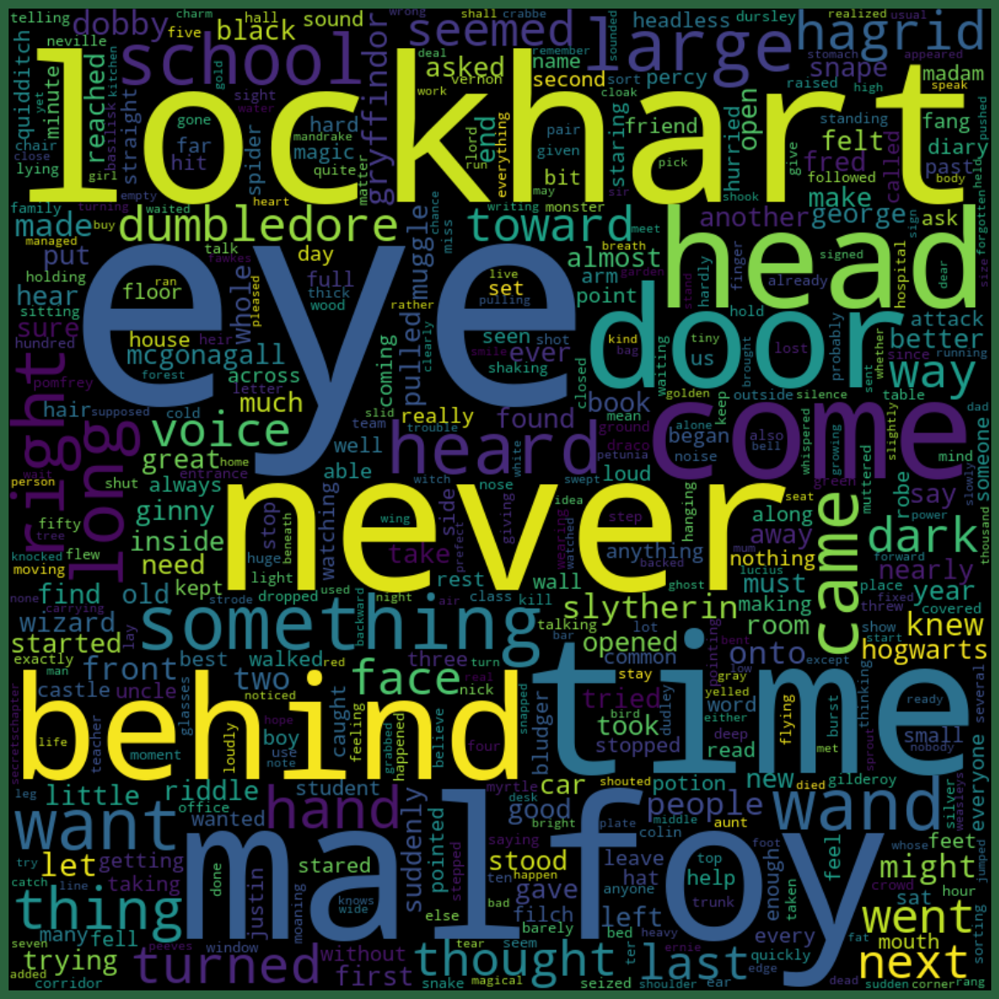

In [14]:
#Book2 Harry Potter and the Chamber of Secrets
wordcloud = WordCloud(width = 800, height = 800, 
                      background_color = 'black',
                      stopwords = stopwords, 
                      min_font_size = 10,
                      max_words=1000,
                      collocations=False).generate(book2_rs)
                     
plt.figure(figsize = (12, 12), facecolor = '#2A623D')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 2) 
plt.show()

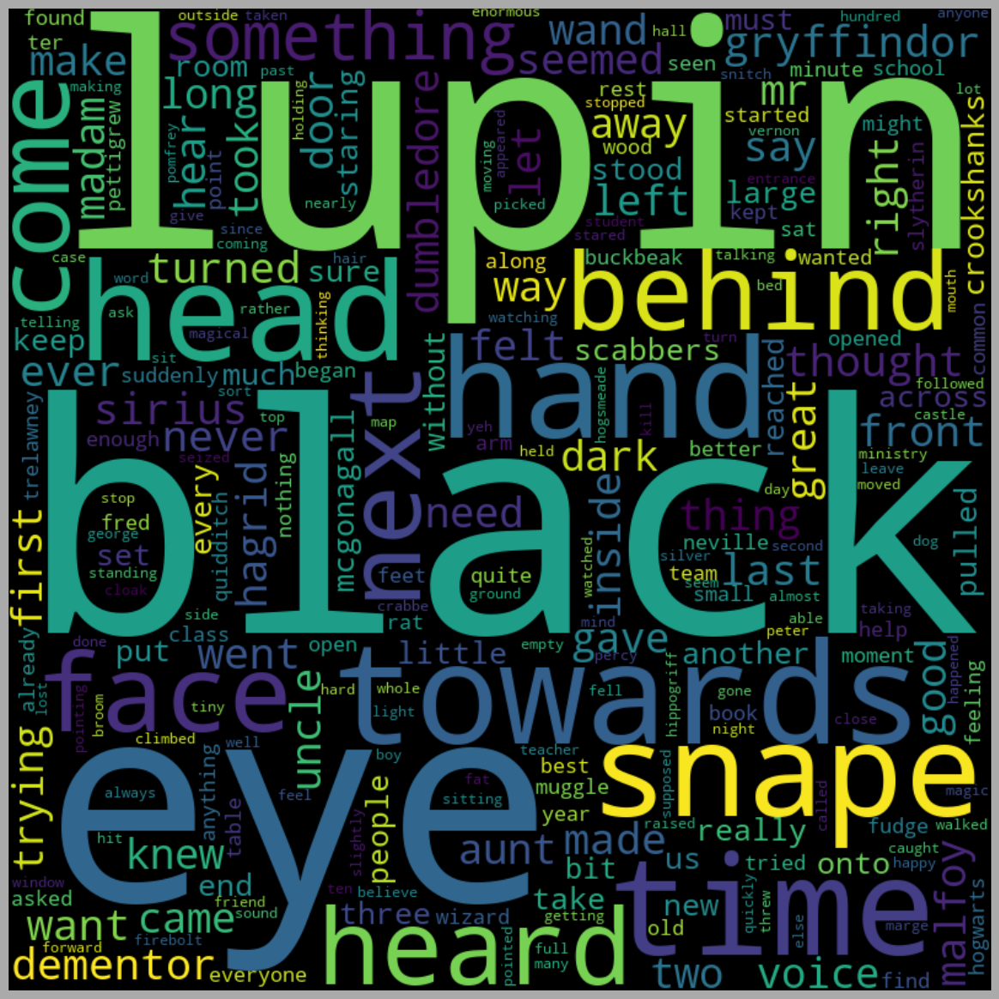

In [15]:
#Book3 Harry Potter and the Prisoner of Azkaban
wordcloud = WordCloud(width = 800, height = 800, 
                      background_color = 'black',
                      stopwords = stopwords, 
                      min_font_size = 10,
                      max_words=1000,
                      collocations=False).generate(book3_rs)
                     
plt.figure(figsize = (12, 12), facecolor = '#AAAAAA')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 2) 
plt.show()

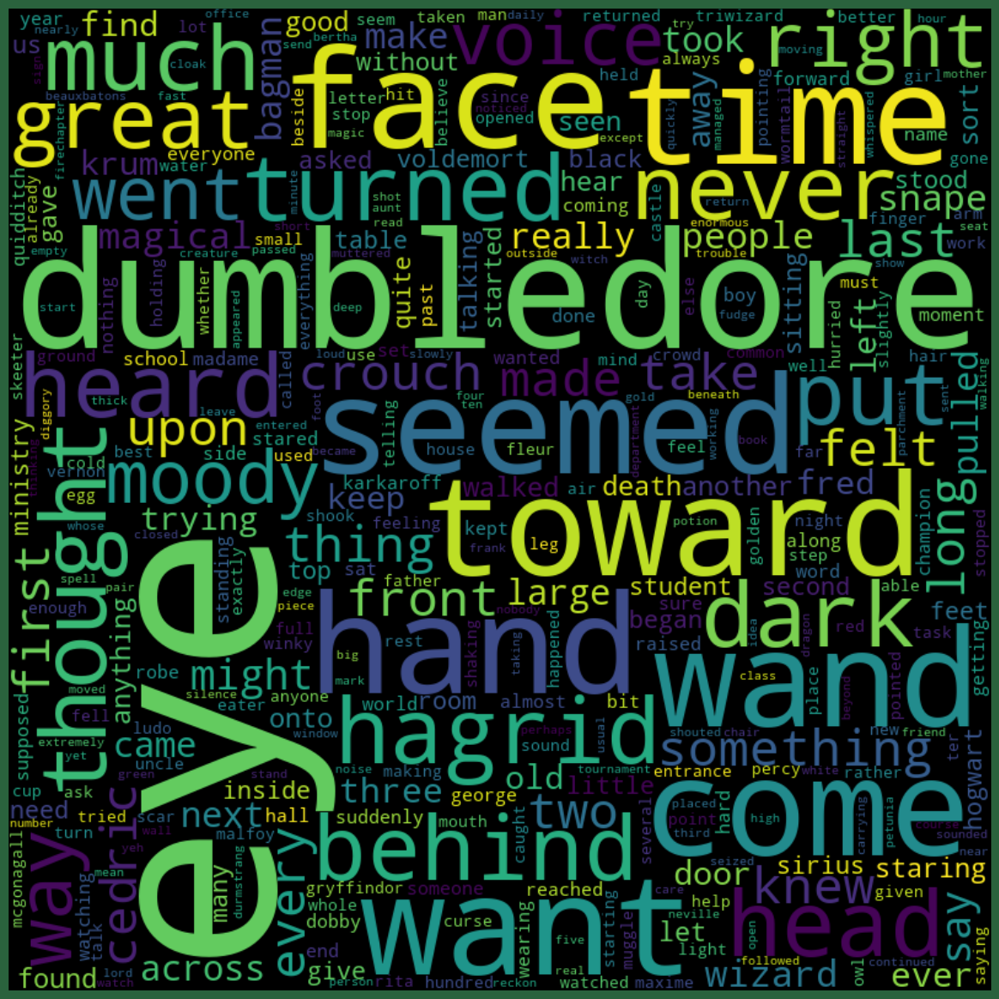

In [16]:
#Book4 Harry Potter and the Goblet of Fire
wordcloud = WordCloud(width = 800, height = 800, 
                      background_color = 'black',
                      stopwords = stopwords, 
                      min_font_size = 10,
                      max_words=1000,
                      collocations=False).generate(book4_rs)
                     
plt.figure(figsize = (12, 12), facecolor = '#2A623D')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 2) 
plt.show()

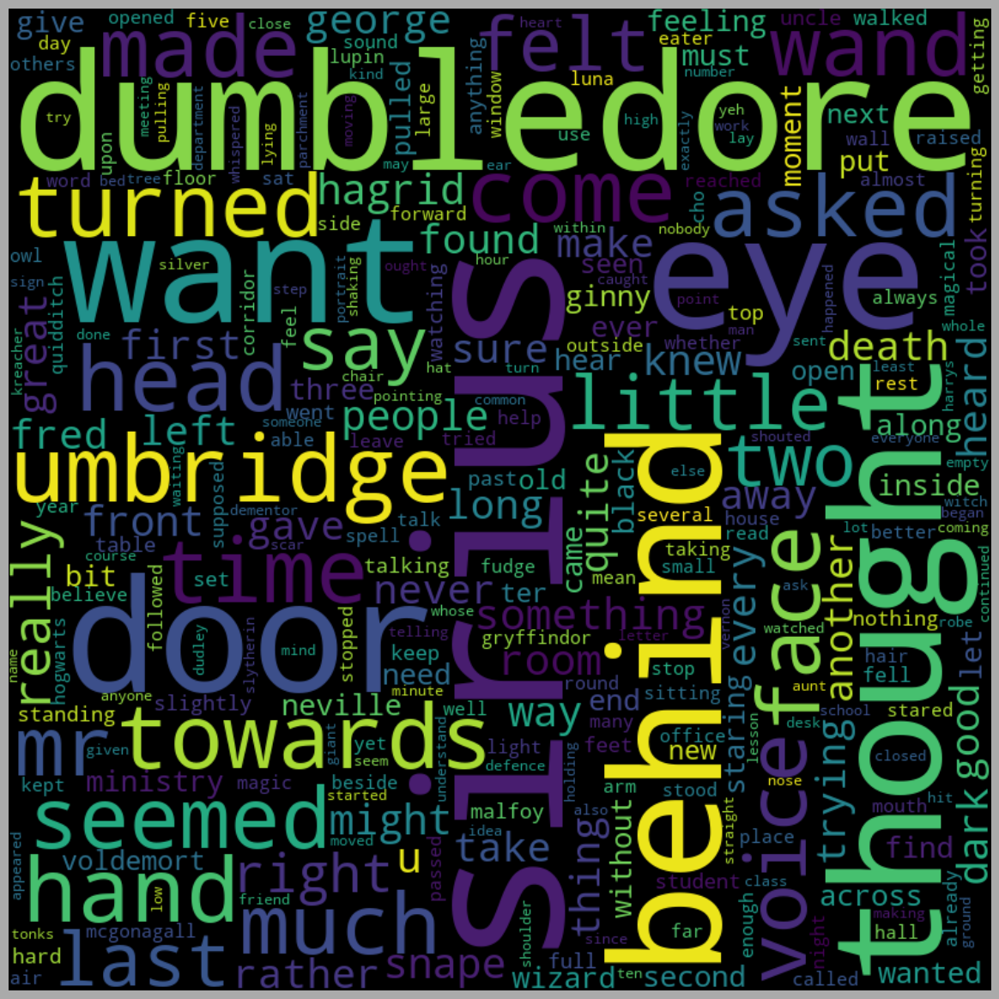

In [17]:
#Book5 Harry Potter and the order of the Phoenix
wordcloud = WordCloud(width = 800, height = 800, 
                      background_color = 'black',
                      stopwords = stopwords, 
                      min_font_size = 10,
                      max_words=1000,
                      collocations=False).generate(book5_rs)
                     
plt.figure(figsize = (12, 12), facecolor = '#AAAAAA')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 2) 
plt.show()

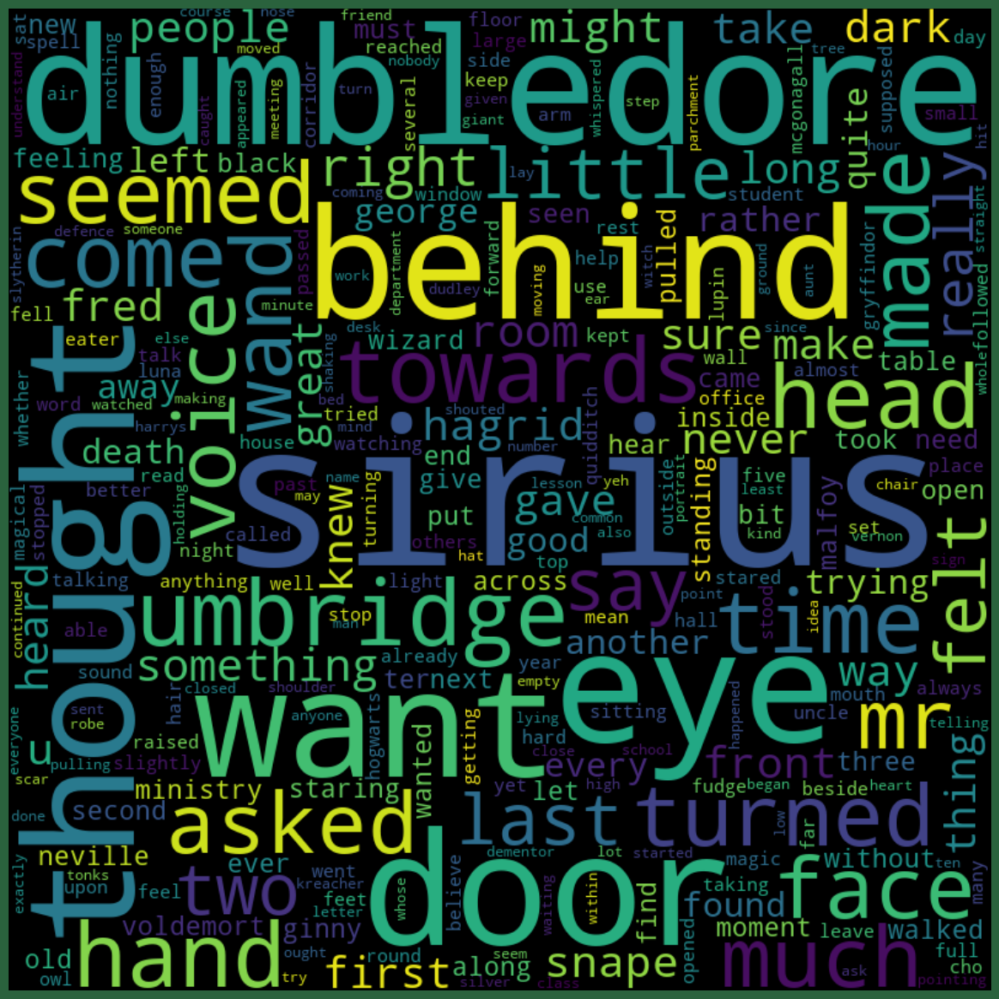

In [18]:
#Book6 Harry Potter and the Half-Blood Prince
wordcloud = WordCloud(width = 800, height = 800, 
                      background_color = 'black',
                      stopwords = stopwords, 
                      min_font_size = 10,
                      max_words=1000,
                      collocations=False).generate(book5_rs)
                     
plt.figure(figsize = (12, 12), facecolor = '#2A623D')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 2) 
plt.show()

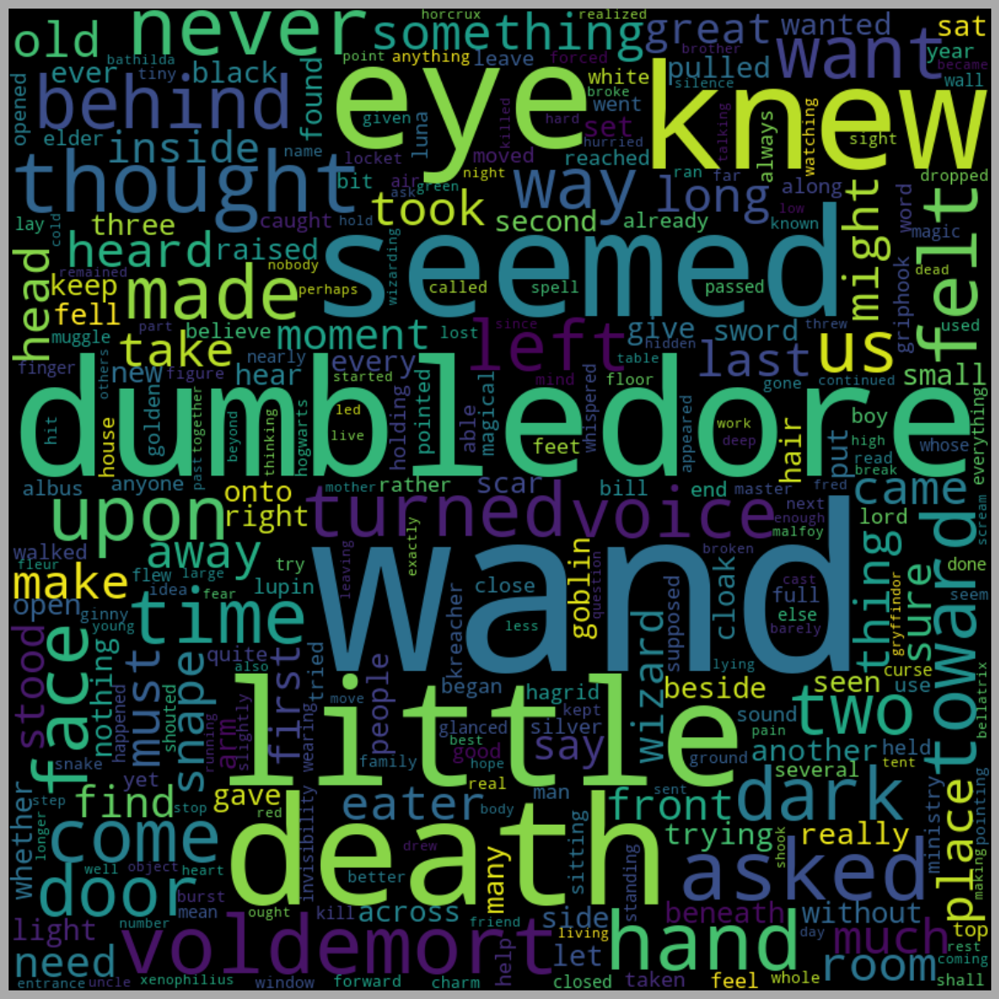

In [19]:
#Book7 Harry Potter and the Deathly Hallows
wordcloud = WordCloud(width = 800, height = 800, 
                      background_color = 'black',
                      stopwords = stopwords, 
                      min_font_size = 10,
                      max_words=1000,
                      collocations=False).generate(book7_rs)
                     
plt.figure(figsize = (12, 12), facecolor = '#AAAAAA')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 2) 
plt.show()

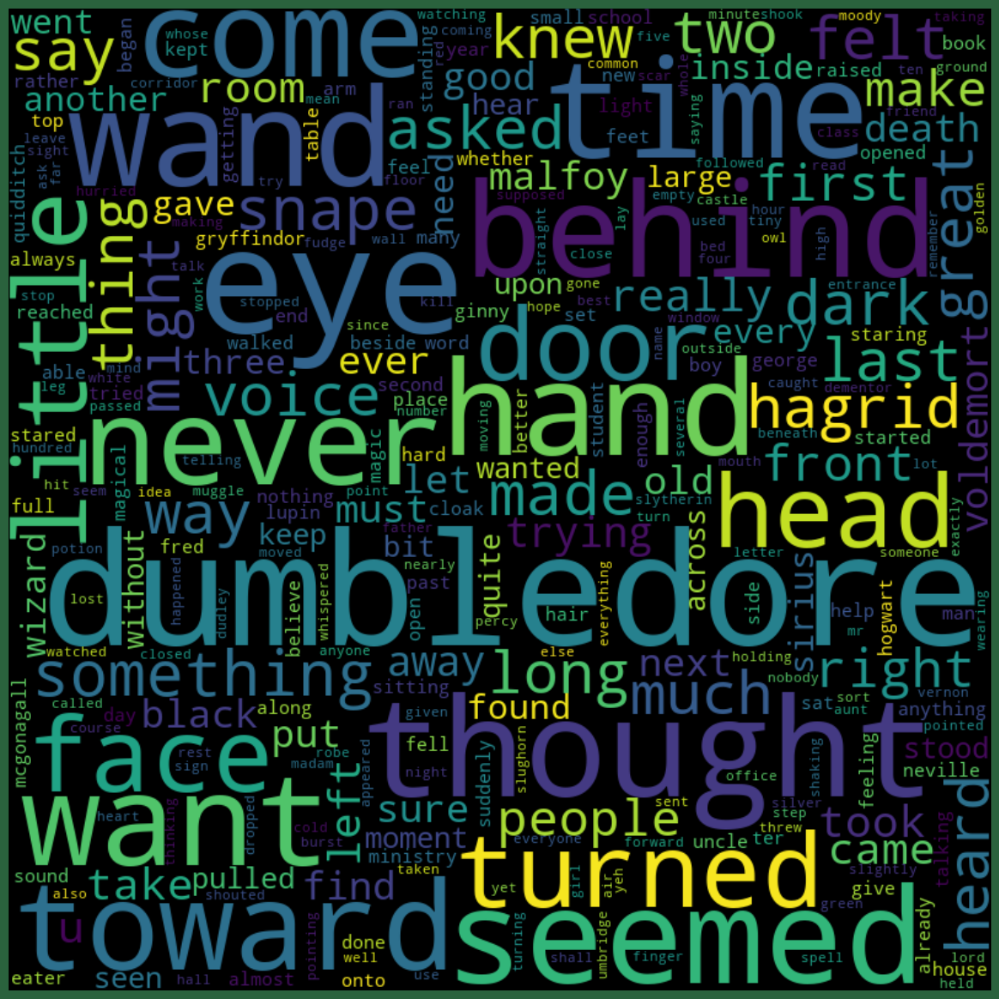

In [20]:
#Complete Works
wordcloud = WordCloud(width = 800, height = 800, 
                      background_color = 'black',
                      stopwords = stopwords, 
                      min_font_size = 10,
                      max_words=1000,
                      collocations=False).generate(book8_rs)
                     
plt.figure(figsize = (12, 12), facecolor = '#2A623D')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 2) 
plt.show()

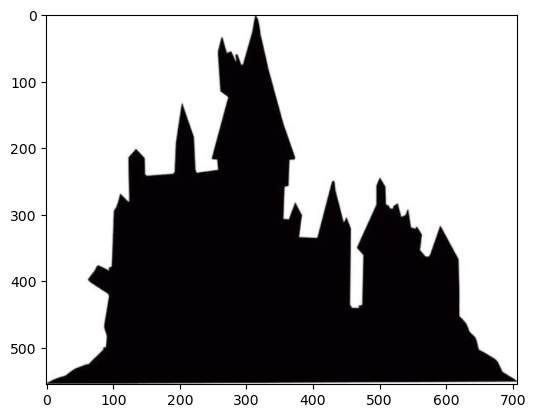

In [21]:
#word cloud will be made with the shape of this image
background_image = np.array(Image.open('pics/Hogwarts.png'))
plt.imshow(background_image)

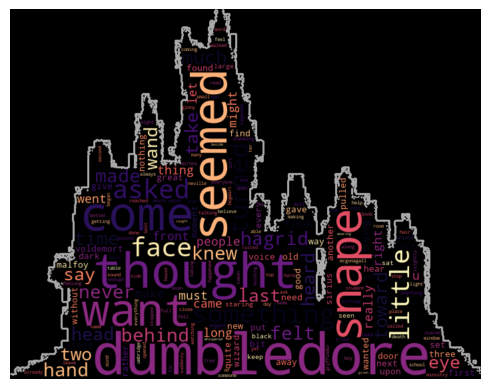

In [22]:
#background image
background_image = np.array(Image.open('pics/Hogwarts.png'))

#assign the data to use- cleaned complete works of all the books
text = book8_rs  

# Generate the word cloud with the mask
word_cloud2 = WordCloud(
    background_color='black',
    mask=background_image,       
    width=2048,
    height=1080,
    colormap='magma',
    contour_width=2,
    contour_color='#AAAAAA'
).generate(text)

# Save and display
word_cloud2.to_file('pics/hogwartsComplete.png')
plt.imshow(word_cloud2, interpolation='bilinear')
plt.axis("off")
plt.show()